In [1]:
#Imports

import h5py
from IPython.display import Image
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import pathlib
import pickle
import warnings
import pandas as pd
from sklearn.decomposition import PCA
import seaborn

import tensorflow as tf
import tensorflow_datasets as tfds

from helper_functions import evaluate_measures, plot_history, plot_measures, load_measures
from HH_CNN import CNNDropConnect, CNNDropout, CNNPlotter
from RegNN import NNDropout, NNDropConnect, NNRegressor

from IPython.display import clear_output

#Global Variables
DATA_DIR = pathlib.Path("horse_or_human")
LABELS = {0: "horse", 1: "human"}
CHECKPOINT_PATH = "checkpoints"
FIG_PATH = "figs"
MEASURES_PATH = "measures"
%matplotlib inline
%load_ext autoreload
%autoreload 2

#Supress warning and error messages
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
tf.get_logger().setLevel("ERROR")
warnings.filterwarnings('ignore')

# 21D006 Project: Monte Carlo Dropout
<em>Authors</em>: Clinton Leung, David Ampudia Vicente

Deep learning has attracted much attention from researchers and practicioners in myriad fields of information engineering. These algorithms are able to learn powerful representations of the data, which can map points from high-dimensional spaces to an array of outputs. However, these mappings are all too often assumed accurate and their predictions are taken blindly, which can have costly consequences in downstream code or real life applications. Deep Bayesian methods exist that account for this model uncertainty, but these are typically prohibitibely expensive, and thus impractical on large-dimensional problems. A more computationally efficient approach was put forth by Yarin Gal and coauthors in their well-cited 2015 [paper](http://proceedings.mlr.press/v48/gal16.pdf), where they suggest practicioners can repurpose the dropout regularization layer at testing time, computing Monte Carlo simulations of the same forward pass and using the variation generated due to the dropout layer to infer the model's uncertainty about a prediction. The authors show how such an approach approximates a Deep Gaussian Process and is convenient to most deep learning applications.

The gist of MC Dropout is that it applies dropout both at train-time and at test-time. A baseline algorithm of MC Dropout can be introduced as follows

- Train a neural network $f_{\theta}(\mathbf{x})$ which contains Dropout layers. 
- At test time, run $T$ stochastic forward passes through $f_{\theta}(\mathbf{x})$ to obtain $T$ predictions for a given input $\mathbf{x}$.
- Conditional on the setup, combine the $T$ predictions to build estimates of uncertainty. More specifically, use the mean prediction across stochastic forward passes as the main prediction, and use the variance across passes to build a measure of uncertainty. 

In this notebook, we present two sets of applications of the MC Dropout approach highlighted above, and also implement a generalization of the model as in [this paper](https://arxiv.org/abs/1906.04569). In a first application, we make use of a regression setup to lay out the building blocks of Monte Carlo Dropout on both synthetic data and the dataset of CO2 emissions used in the seminal paper. The implementation code is available in <code>RegNN.py</code>. Additionally, we investigate an extension to the original paper that allows the neural network to differentiate between <em>aleatoric</em> and <em>epistemic</em> uncertainty. In a second application, we turn to a classification setup, where softmax probabilities have traditionally been used as a proxy for uncertainty but which we show overestimate the confidence the model has on its predicitions. We employ both the baseline MC Dropout as well as its generalization Drop Connect, which directly applies Bernoulli dropouts to every weight in each dense layer. The implementation of Drop Connect is available in <code>CustomDropout.py</code>, while the classifier's code can be found in <code>HH_CNN.py</code>. In order to better understand the performance of these uncertainty-aware neural networks, we train a Convolutional Neural Network to classify pictures of humans and horses, and increasingly feed it out-of-sample images that are neither a horse or a human.

The results suggest that, while a good first approximation to uncertainty and theoretically sound, Monte Carlo Dropout and DropConnect algorithms have some shortcomings. In the regression scenario, there is little evidence that the algorithm is able to capture uncertainty over the model and not over the neural network itself, which has also been pointed out by practicioners and has led to further exploration in this field. Additionally, softmax scores in the classification case highlight the limitations of Monte Carlo dropout: uncertainty increases as more unrelated images are fed to the trained CNN, but the model remains confident for most misclassifications. 

Nonetheless, the algorithms' performance still has its merits. In the regression case, it is able to efficiently distinguish aleatoric from epistemic uncertainty, which is tested using different combinations of simulated data. In the classification case, the increase in uncertainty may be enough to flag many of these images, which still renders this approach useful as more uncertain images could be validated by a human in a real scenario. Additionally, we make a compelling case against the use of softmax scores as a measure of certainty. Our results show that the softmax scores of the non-dropout models are purportedly more certain as we use increasingly out-of-sample images, while the opposite occurs for MC Dropout and DropConnect. In light of this, the use of the latter two algorithms is vindicated as a first approximation to designing uncertainty-aware neural networks.

## Regression

We begin by using MC Dropout in an MLP neural network, which for consistency with the original paper by Gal and coauthors we define as having 4 hidden layers of 1024 nodes each, with ReLU activation functions. In the baseline scenario we use the mean square error loss function, but in downstream code we will transition to the negative log likelihood. A diagram of this first regression model is shown below.

The model is trained in the usual fashion: we compute the MSE loss in a forward pass, using dropout layers to randomly assign zero input to nodes within each hidden layer. We then update the weights of the layers during backpropagation, and terminate the algorithm when the validation loss plateaus. At prediction time, however, we keep the dropout layers active, and run $T$ number of stochastic forward passes, where some nodes receive zero-value inputs. This will define an approximate predictive distribution, which is given by 

$$
q\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}\right)=\int p\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}, \omega\right) q(\omega) \mathrm{d} \omega
$$

where $\mathbf{y}^{*}$ is our test target variable, $\mathbf{x}^{*}$ is the covariate space (univariate in our simple example). With dropout, we sample binary variables for every input point and for every network unit in each layer. We summarize this as $\boldsymbol{\omega}=\left\{\widehat{\mathbf{M}}_{i}\right\}_{i=1}^{L}$, the set of random matrices $\widehat{\mathbf{M}}_{i}$ for the $L$ layers of the model with dimensions $K_{i} \times K_{i-1}$ for each layer $i$. In words, $\boldsymbol{\omega}$ captures the binary realizations of the dropout assignments across nodes and layers.

Sampling $T$ sets of vectors of realizations from a Bernoulli distribution, we can approximate the first moment of the predictive distribution above as follows.
$$
\mathbb{E}_{q\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}\right)}\left(\mathbf{y}^{*}\right) \approx \frac{1}{T} \sum_{t=1}^{T} \widehat{\mathbf{y}}^{*}\left(\mathrm{x}^{*}, \widehat{\mathbf{M}}_{1}^{t}, \ldots, \widehat{\mathbf{M}}_{L}^{t}\right)
$$
The authors refer to this Monte Carlo estimate as MC dropout, and in layman terms this is just the average over the point estimates of the $T$ forward passes. 

Similarly, the second moment writes 

$$
\mathbb{E}_{q\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}\right)}\left(\left(\mathbf{y}^{*}\right)^{T}\left(\mathbf{y}^{*}\right)\right) \approx \frac{1}{T} \sum_{t=1}^{T} \widehat{\mathbf{y}}^{*}\left(\mathbf{x}^{*}, \widehat{\mathbf{M}}_{1}^{t}, \ldots, \widehat{\mathbf{M}}_{L}^{t}\right)^{T} \widehat{\mathbf{y}}^{*}\left(\mathbf{x}^{*}, \widehat{\mathbf{M}}_{1}^{t}, \ldots, \widehat{\mathbf{M}}_{L}^{t}\right)
$$

which immediately yields an expression for the variance of the prediction

$$
\operatorname{Var}_{q\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}\right)}\left(\mathbf{y}^{*}\right) \approx \frac{1}{T} \sum_{t=1}^{T} \widehat{\mathbf{y}}^{*}\left(\mathbf{x}^{*}, \widehat{\mathbf{M}}_{1}^{t}, \ldots, \widehat{\mathbf{M}}_{L}^{t}\right)^{T} \widehat{\mathbf{y}}^{*}\left(\mathbf{x}^{*}, \widehat{\mathbf{M}}_{1}^{t}, \ldots, \widehat{\mathbf{M}}_{L}^{t}\right)-\mathbb{E}_{q\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}\right)}\left(\mathbf{y}^{*}\right)^{T} \mathbb{E}_{q\left(\mathbf{y}^{*} \mid \mathbf{x}^{*}\right)}\left(\mathbf{y}^{*}\right)
$$

In order to show how this approach works in practice, let's define a first synthetic dataset. 

In [2]:
def sine_data(n=2048, a:int=0, b:int=10, noise:float=0.3):
    x = np.linspace(a,b,n)
    y = 3*np.sin(x)
    y = y+np.random.normal(0,noise*np.abs(y),n)
    return y,x

y_train, X_train = sine_data(n=4096, a=-2.5, b=2.5)
y_test, X_test = sine_data(n=512, a=-2.5, b=5)

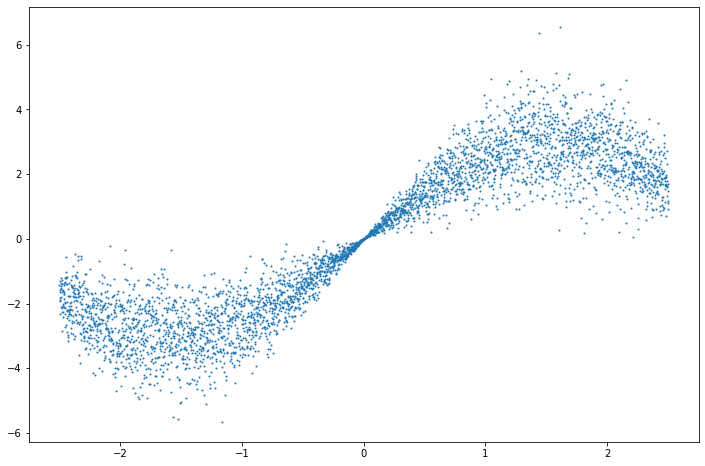

In [3]:
fig, ax = plt.subplots(figsize=(12,8))
ax.scatter(X_train, y_train, s=1)

Let's instantiate the basic MLP NN Dropout model described above, which can be found in <code>RegNN.py</code>.

In [4]:
model = NNDropout(output=1, p_dropout=0.2)

And let's take a look at the diagram of the model. Note that the input dimension is set to 1 for this mock example. More importantly, however, the last dense layer has an output dimension of 1 as well, which represents a single prediction $$ \widehat{\mathbf{y}}^{*}\left(\mathrm{x}^{*}, \widehat{\mathbf{M}}_{1}^{t}, \ldots, \widehat{\mathbf{M}}_{L}^{t}\right)$$

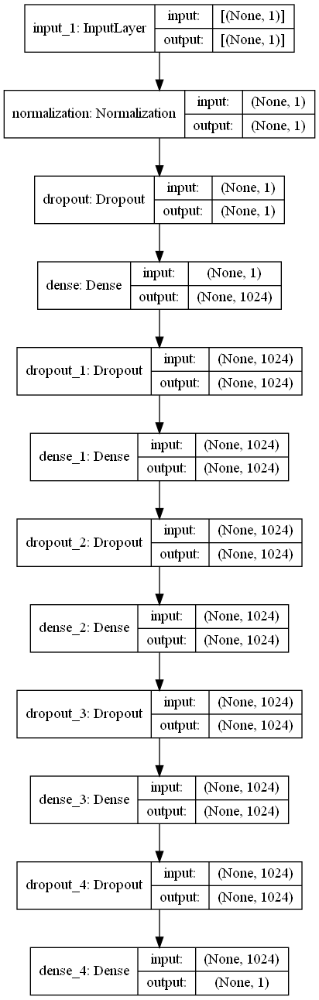

In [5]:
tf.keras.utils.plot_model(
    model.build_graph(dim=1),
    dpi=96, show_shapes=True, show_layer_names=True, expand_nested=False
)

We can now train the model. We keep the number of epochs relatively low for the purposes of this exercise.

In [6]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
model.compile(optimizer=optimizer, loss="mse", metrics=["mean_squared_error"])
model.fit(X_train, y_train, epochs=10, verbose=1, validation_split=0.2)

Epoch 1/10
103/103 [==============================] - 3s 21ms/step - loss: 2.4709 - mean_squared_error: 2.4709 - val_loss: 1.8129 - val_mean_squared_error: 1.8129
Epoch 2/10
103/103 [==============================] - 1s 8ms/step - loss: 1.6855 - mean_squared_error: 1.6855 - val_loss: 3.0276 - val_mean_squared_error: 3.0276
Epoch 3/10
103/103 [==============================] - 1s 7ms/step - loss: 1.3333 - mean_squared_error: 1.3333 - val_loss: 2.6820 - val_mean_squared_error: 2.6820
Epoch 4/10
103/103 [==============================] - 1s 7ms/step - loss: 1.4060 - mean_squared_error: 1.4060 - val_loss: 2.0489 - val_mean_squared_error: 2.0489
Epoch 5/10
103/103 [==============================] - 1s 7ms/step - loss: 1.4880 - mean_squared_error: 1.4880 - val_loss: 1.6972 - val_mean_squared_error: 1.6972
Epoch 6/10
103/103 [==============================] - 1s 7ms/step - loss: 1.3881 - mean_squared_error: 1.3881 - val_loss: 1.6019 - val_mean_squared_error: 1.6019
Epoch 7/10
103/103 [=======

Let's now draw predictions on some out-of-sample data, which includes both $X$ points we trained on as well as never-seen $X$ data.

In [7]:
y_pred = model.predict(X_test)

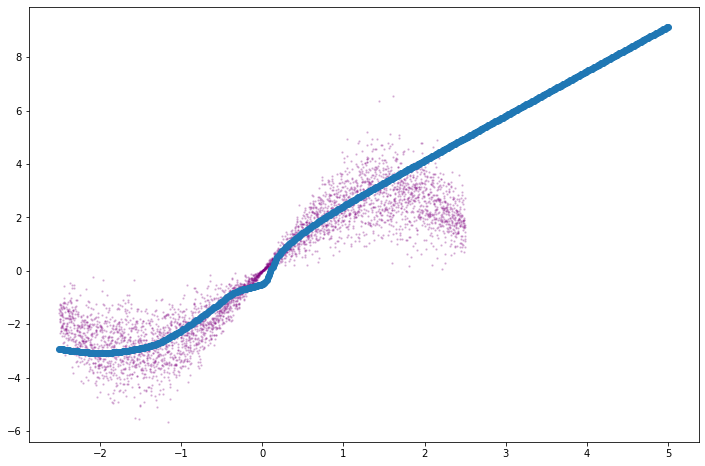

In [8]:
fig, ax = plt.subplots(figsize=(12,8))
ax.scatter(X_train, y_train, s=2, c="purple",alpha=.2)
plt.scatter(X_test, y_pred)

The model is able to capture the non-linear relationship between $X$ and $Y$ with only a handful of epochs, with the predicted values on our out-of-sample data largely fitting our data perfectly. However, we are unable to claim anything about the certainty with which our model makes predictions at any given $X$ point. Visual inspection, for example, suggests that the predictions around zero should carry a high degree of certainty as all training observations are concentrated around zero. Conversely, we would expect more uncertain predictions to occur around the boundaries of this data (which is by construction designed to be noisier), while uncertainty should be maximized in the area with no observations for $X$ during training.

In order to achieve some notion of uncertainty, let's make predictions on the same data using our MC Dropout approach. In the code snippet below, <code>model.predict()</code> conducts $T$ forward passes of the data, and mean and variance estimates at each $X$ point are obtained using the procedure described in detail above. 

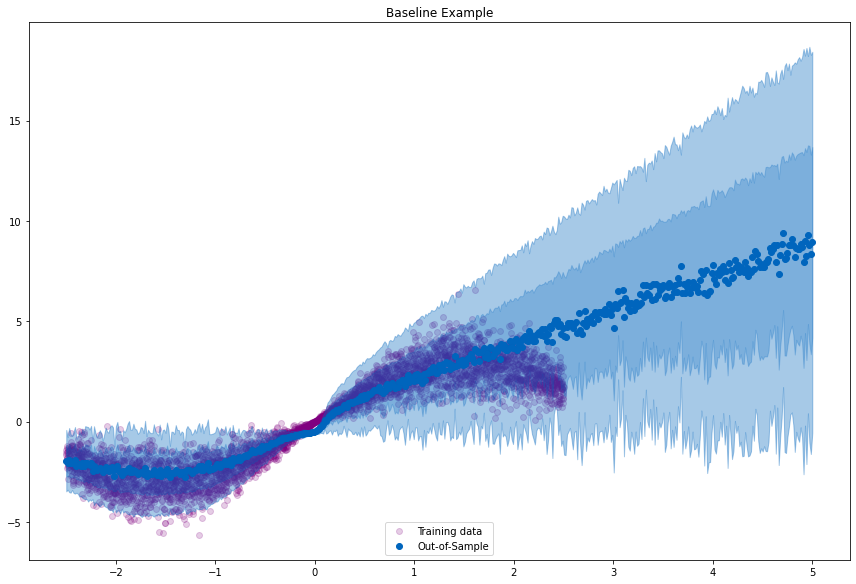

In [9]:
model_utils = NNRegressor(model=model)
model_utils.predict(X_test, mc=True, T=100)
figure = model_utils.plot(Xtrain=X_train, Ytrain=y_train, combined=False, title="Baseline Example")

At face value, MC Dropout is able to succesfully quantify uncertainty. As intended, the predictions the algorithm makes have the lowest degree of uncertainty around zero, while the confidence intervals (measured as one and two standard deviations of the estimated variance around the estimated mean) widen as the dispersion of the data increases. Finally, out-of-sample predictions showcase the highest degree of uncertainty, which increases as we move away from observed values.

The dropout probability is set at 0.1, but note that this is a hyperparameter that can be finetuned (Gal and coauthors do so in a follow up [paper](http://papers.neurips.cc/paper/6949-concrete-dropout.pdf)). Let's compare a rate of dropout of 0.1 with a rate of 0.2 using a longer sequence of our sine function, which we train outside this notebook to reduce running time.

#### Dropout Rate of 0.1

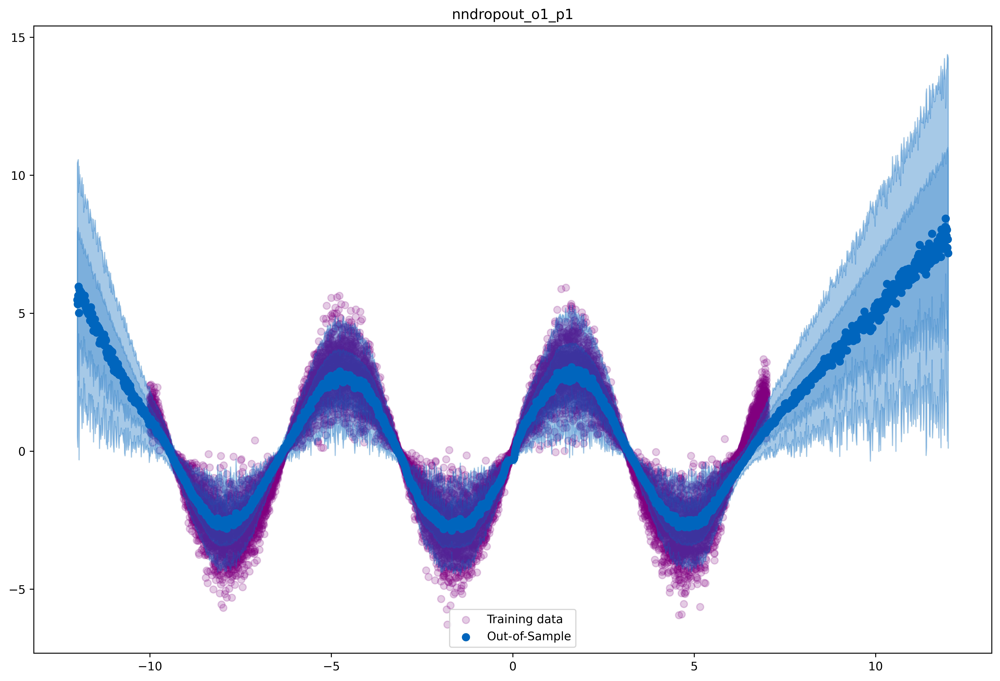

In [10]:
Image(os.path.join("figs", "nndropout_o1_p1.png"),)

#### Dropout rate of 0.2

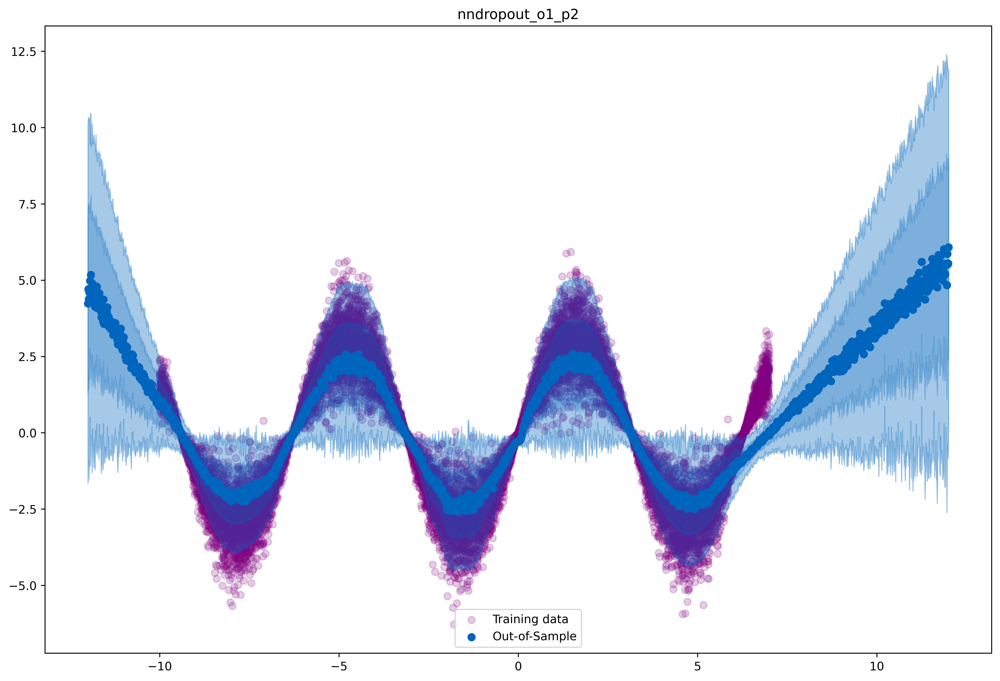

In [11]:
# Dropout rate of 0.2
Image(os.path.join("figs", "nndropout_o1_p2.png"),)

As expected, the uncertainty is larger for a higher dropout rate, since more variation is induced across stochastic forward passes. The authors have developed a grid-search like algorithm to fine-tune the dropout rate in their 2017 follow up paper [Concrete Dropout](papers.neurips.cc/paper/6949-concrete-dropout.pdf), but such a behavior begs the question about the nature of the uncertainty being captured by MC Dropout. We briefly investigate this in the next section, but let's first present a more credible application to a real dataset.

### Application: Combined cycle power plant electrical energy output estimation

We extend our analysis to the multivariate case, and to do so we present a [dataset](http://archive.ics.uci.edu/ml/datasets/Combined+Cycle+Power+Plant) of energy output at a combined cycle power plant. The dataset contains 9568 datapoints, and consists of four features: hourly average ambient temperature (T), Ambient Pressure (AP), Relative Humidity (RH) and Exhaust Vacuum (V). The goal is to predict the electrical energy output (EP) of the plant.

In [12]:
df = pd.read_excel("co2/ccpp.xlsx", engine="openpyxl")

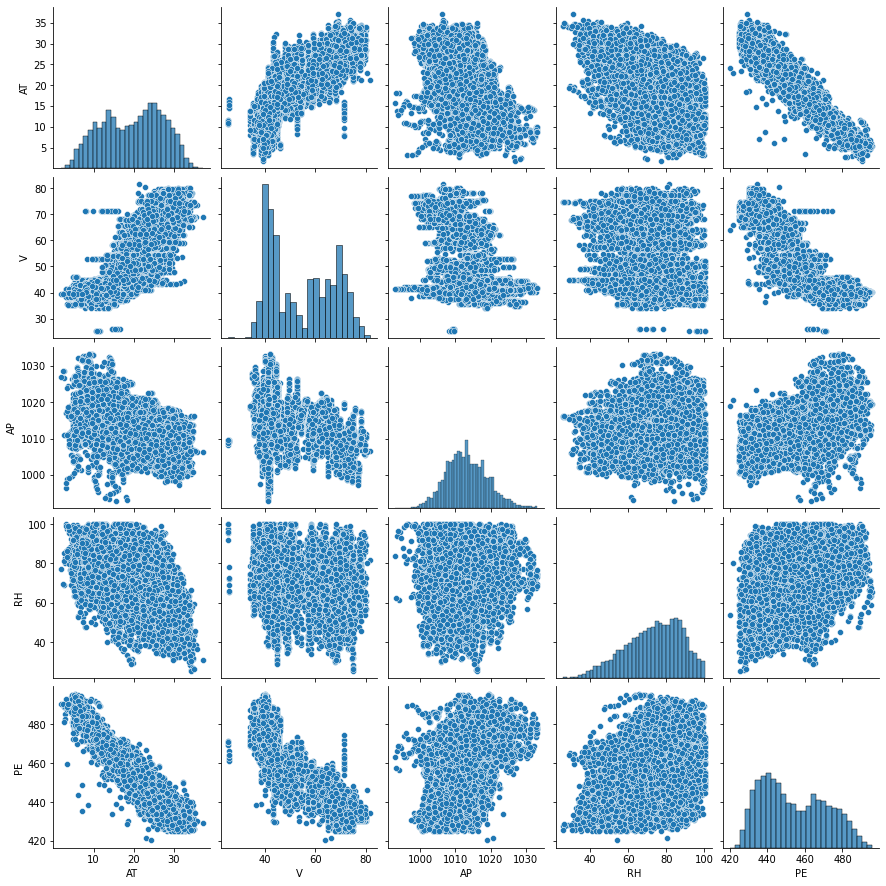

In [13]:
seaborn.pairplot(df)

We will train a model using all four features to predict the electricity output. In order to do so, we first standardize and order the data. We'll extract the first principal component of the feature space, which we will use to plot the prediction and uncertainty results below.

In [14]:
# Standardize, sort
df = df.to_numpy()
target = (df[:,4] - np.mean(df[:,4]))/np.sqrt(np.var(df[:,4])) 
x = (df[:,:4] - np.mean(df[:,:4], axis=0))/np.sqrt(np.var(df[:,:4], axis=0)) 

pca = PCA(n_components=1)
pcaX = pca.fit_transform(x)
x = np.append(x, pcaX, axis=1)
data = np.append(x, target[:,np.newaxis], axis=1)
data = np.array(sorted(data, key=lambda x: x[4]))

We create a small train, test split for downstream convenience.

In [15]:
train = data[:-2000]
X_train, y_train = train[:,:4], train[:,5]
test = data[-2000:]
X_test, y_test = test[:,:4], test[:,5]

In [16]:
model = NNDropout(output=1, p_dropout=0.2) # Note we use output=2 to instantiate the two-head network

We only train a few epochs, but the fit is already decent.

In [17]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
model.compile(optimizer=optimizer, loss="mse", metrics=["mean_squared_error"])
model.fit(X_train, y_train, epochs=10, verbose=1, validation_split=0.2)

Epoch 1/10
190/190 [==============================] - 2s 9ms/step - loss: 0.2309 - mean_squared_error: 0.2309 - val_loss: 0.0522 - val_mean_squared_error: 0.0522
Epoch 2/10
190/190 [==============================] - 1s 6ms/step - loss: 0.1590 - mean_squared_error: 0.1590 - val_loss: 0.0536 - val_mean_squared_error: 0.0536
Epoch 3/10
190/190 [==============================] - 1s 7ms/step - loss: 0.1507 - mean_squared_error: 0.1507 - val_loss: 0.0980 - val_mean_squared_error: 0.0980
Epoch 4/10
190/190 [==============================] - 1s 7ms/step - loss: 0.1371 - mean_squared_error: 0.1371 - val_loss: 0.0537 - val_mean_squared_error: 0.0537
Epoch 5/10
190/190 [==============================] - 1s 7ms/step - loss: 0.1351 - mean_squared_error: 0.1351 - val_loss: 0.1030 - val_mean_squared_error: 0.1030
Epoch 6/10
190/190 [==============================] - 1s 7ms/step - loss: 0.1372 - mean_squared_error: 0.1372 - val_loss: 0.0847 - val_mean_squared_error: 0.0847
Epoch 7/10
190/190 [========

Let's draw predictions for both point estimates and local variances of all points, both in test and training.

In [18]:
model_utils = NNRegressor(model=model)
y_pred, y_var = model_utils.predict(data[:,:4], mc=True, T=200)

Finally, let's use the first component to plot the results.

Text(0.5, 1.0, 'Net Hourly Electrical Energy Output')

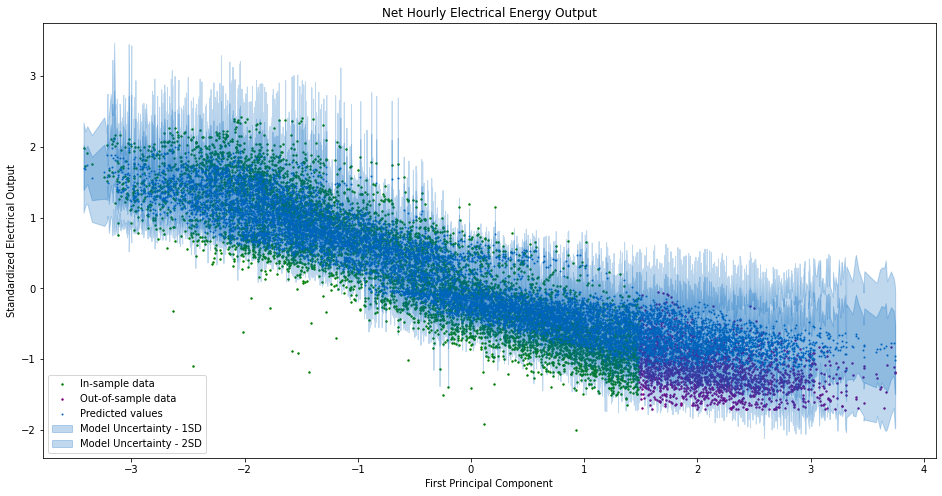

In [19]:
fig, ax = plt.subplots(figsize=(16,8))

ax.scatter(data[:-2000,4], data[:-2000,5], s=2, color="green", label="In-sample data")
ax.scatter(data[-2000:,4], data[-2000:,5], s=2, color="purple", label="Out-of-sample data")
ax.scatter(data[:,4], y_pred, s=1, color=(0.0, 101.0 / 255.0, 189.0 / 255.0), label="Predicted values")
ax.set_xlabel("First Principal Component")
ax.set_ylabel("Standardized Electrical Output")
ax.fill_between(
    data[:,4].reshape(len(data),),
    np.squeeze(y_pred - np.sqrt(y_var)),
    np.squeeze(y_pred + np.sqrt(y_var)),
    alpha=0.25,
    color=(0.0, 101.0 / 255.0, 189.0 / 255.0), 
    label="Model Uncertainty - 1SD"
)
ax.fill_between(
    data[:,4].reshape(len(data),),
    np.squeeze(y_pred - 2*np.sqrt(y_var)),
    np.squeeze(y_pred + 2*np.sqrt(y_var)),
    alpha=0.25,
    color=(0.0, 101.0 / 255.0, 189.0 / 255.0), 
    label="Model Uncertainty - 2SD"
)

ax.legend(loc="lower left")

ax.set_title("Net Hourly Electrical Energy Output")

The points in blue are the predictions made by the model, both for in-sample (green) and out-of-sample (purple) data. Importantly, the degree of uncertainty the model estimates when predicting energy output is higher in out-of-sample data, and particularly in sparsely populated areas of the space spanned by the first principal component. All in all, the results are encouraging, and MC Dropout uncertainty seems to correctly capture the model uncertainty. We now turn to differentiating between the classes of uncertainty.

## Aleatoric vs. Epistemic Uncertainty
In addition to quantifying uncertainty, as done above, it can make sense to qualify it. In the Bayesian deep learning literature, a distinction is commonly made between _epistemic_ uncertainty and _aleatoric_ uncertainty. The former refers to imperfections in the model, which can be improved on with additional observations. The latter captures measurement error and data sampling processes, and is as such irreductible. Distinguishing between the two can be important in practice, since it may guide the practitioner's hand in acquiring more data or being cautions about any inference claims.

Gal and coauthors propose the [following modifications](https://proceedings.neurips.cc/paper/2017/file/2650d6089a6d640c5e85b2b88265dc2b-Paper.pdf) to their algorithm above to capture both types of uncertainty. 

- Modify the neural network to estimate probability distributions rather than point estimates. The authors go about this by assuming a Gaussian distribution to the data and altering the network output layer to two heads, which aim to learn the two parameters of the Gaussian, ie.

$$
\begin{aligned}
&\hat{\mu}, \hat{\sigma}^{2}=f_{\theta}(\mathbf{x}) \\
&p_{\theta}(y \mid \mathbf{x})=\mathcal{N}\left(\hat{\mu}, \hat{\sigma}^{2}\right)
\end{aligned}
$$

- To identify both parameters, the loss to minimize is now the negative log likelihood loss, which is defined as 

$$
-\log p_{\theta}(y \mid \mathbf{x})=\frac{\log \hat{\sigma}^{2}}{2}+\frac{(y-\hat{\mu})^{2}}{2 \hat{\sigma}^{2}}
$$

The combined uncertainty is now the sum of the variation induced by the $T$ forward stochastic passes (epistemic uncertainty) and the irreductible variation in the model, defined by $\hat{\sigma}^{2}$. In simplified notation, the combined variance of any prediction is

$$
\operatorname{Var}(\mathbf{y^*}) \approx \frac{1}{T} \sum_{t=1}^{T} \hat{\mathbf{y}}_{t}^{2}-\left(\frac{1}{T} \sum_{t=1}^{T} \hat{\mathbf{y}}_{t}\right)^{2}+\frac{1}{T} \sum_{t=1}^{T} \hat{\sigma}_{t}^{2}
$$

The implementation code of this model is in <code>RegNN.py</code>. Let's use our toy function above to explore the model's implications on our estimates of uncertainty. 

In [20]:
model = NNDropout(output=2, p_dropout=0.2) # Note we use output=2 to instantiate the two-head network

y_train, X_train = sine_data(n=4096, a=4, b=8)
y_test, X_test = sine_data(n=512, a=4, b=9)

Note the use of the negative log likelihood loss function, which is a static method of the NNDropout class object.

In [21]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
model.compile(optimizer=optimizer, loss=NNDropout.nll, metrics=["mean_squared_error"])
model.fit(X_train, y_train, epochs=20, verbose=1, validation_split=0.2)

Epoch 1/20
103/103 [==============================] - 1s 9ms/step - loss: 1.3040 - mean_squared_error: 6.8738 - val_loss: 2.2980 - val_mean_squared_error: 9.5030
Epoch 2/20
103/103 [==============================] - 1s 7ms/step - loss: 1.0634 - mean_squared_error: 6.1511 - val_loss: 3.4235 - val_mean_squared_error: 8.0850
Epoch 3/20
103/103 [==============================] - 1s 8ms/step - loss: 0.5786 - mean_squared_error: 3.5338 - val_loss: 12.8551 - val_mean_squared_error: 13.5612
Epoch 4/20
103/103 [==============================] - 1s 8ms/step - loss: 0.4306 - mean_squared_error: 3.2558 - val_loss: 10.5404 - val_mean_squared_error: 12.1086
Epoch 5/20
103/103 [==============================] - 1s 8ms/step - loss: 0.3998 - mean_squared_error: 3.3817 - val_loss: 11.4004 - val_mean_squared_error: 12.0687
Epoch 6/20
103/103 [==============================] - 1s 8ms/step - loss: 0.3287 - mean_squared_error: 3.2873 - val_loss: 17.7021 - val_mean_squared_error: 13.8009
Epoch 7/20
103/103 [

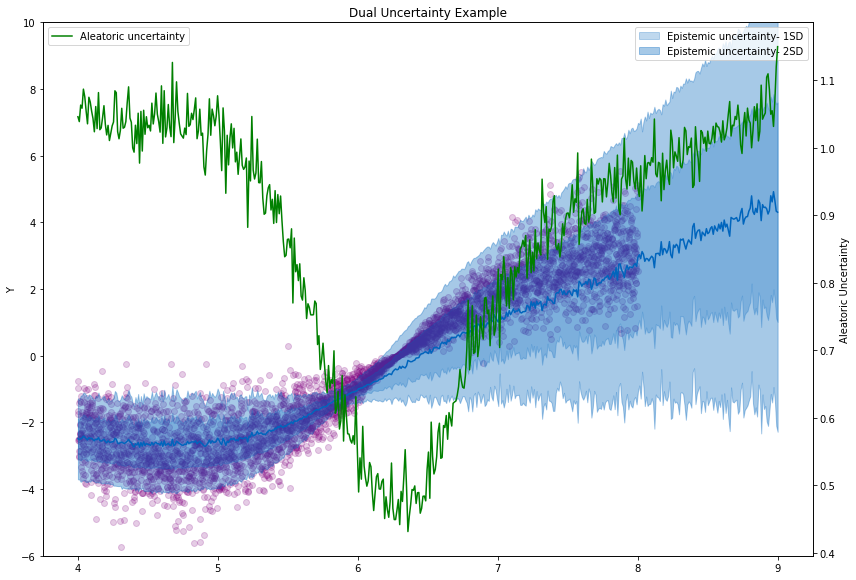

In [22]:
model_utils = NNRegressor(model=model)
model_utils.predict(X_test, mc=True, T=200)
figure = model_utils.plot(Xtrain=X_train, Ytrain=y_train, combined=False, title="Dual Uncertainty Example", ylims=[-6,10])

Similar to before, the model is less confident about predictions around areas with high noise in the observations (capturing high epistemic uncertainty), and is particularly unsure in the domain of $X$ where it has seen no observations during training. Aleatoric uncertainty is displayed by the green line, which increases on out-of-sample data and is low were data is highly concentrated. Note that in practice aleatoric uncertainty is averaged over observations, so the line above can be interpreted as the marginal contribution to the average degree of aleatoric uncertainty.

Let's perform the same analysis on a longer sequence, again loading in results computed in <code>reg_basic_dropout.py</code>.

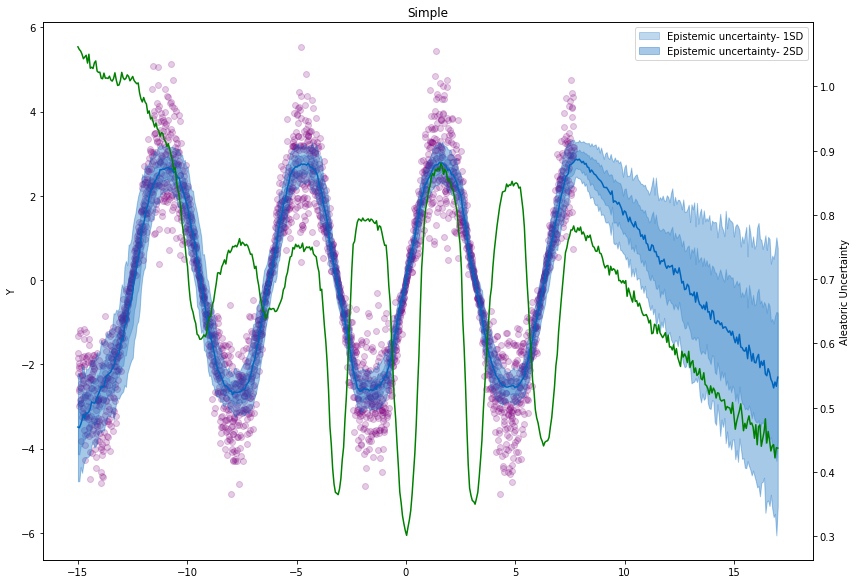

In [23]:
Image(os.path.join("figs", "combined_output.png"),)

We can also plot the combined uncertainty, ie. the sum of the aleatoric and epistemic uncertainty.

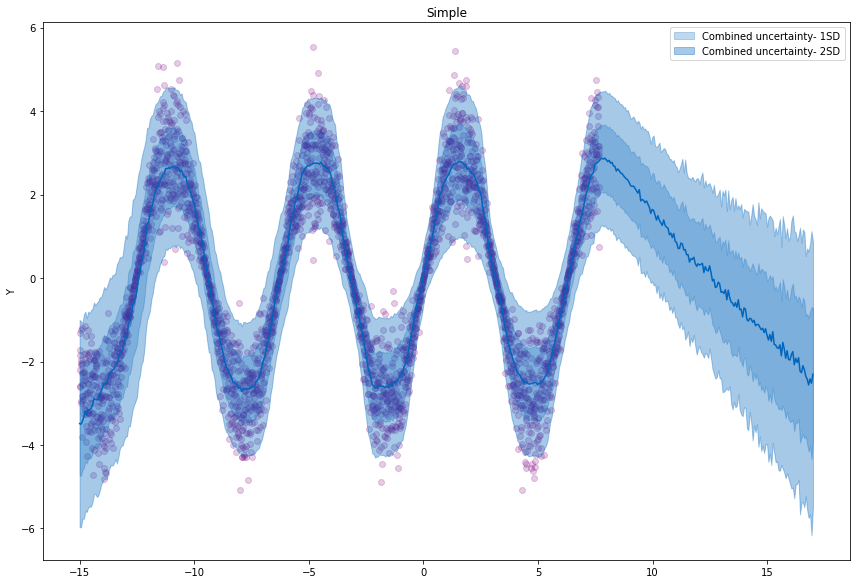

In [24]:
Image(os.path.join("figs", "joint_output.png"),)

All in all, this section introduces a method to obtain theoretically grounded uncertainty estimates from neural networks. The separation of both types of uncertainty is practically relevant, and it performs well in approximating out-of-sample uncertainty. Nonetheless, the toy example above masks less desirable properties, such the still high degree of certainty the algorithm exhibits on harder to predict or classify samples. We explore this as we introduce our next application, a multi-class image classification exercise.

## Classification

Here we get a synthetic dataset from [Laurence Moroney's website](https://laurencemoroney.com) and contains CGI generated horses and humans. Laurence's idea was to see if CGI generated images could be used to train a neural network to predict on real images afterwards. This is just an aside that is not part of our project here. We will instead use this synthetic data to demonstrate MC Dropout's ability to quantify model uncetainty. The softmax probability given is often wrongly interpreted as a measure of model uncertainty, but this is not apt. We will show this by using our trained network to classify images from two out of sample datasets. These datasets contain image of cats, dogs and flowers. An ideal uncertainty aware neural network should be able to know that it is uncertain with this out of sample data. To minimize running time the network has been trained and we are only reloading the weights. (See <code>basic_dropout.py</code> for the training script and details. See <code>dropout_plotting.py</code> for the evaluation of the prediction measures that were run to gather our data.) Let's start by loading all the relevant datasets. 

In [16]:
#Load the data
batch_size = 16
img_height = 300
img_width = 300
modelnames = ["dropout_p5", "dropout_p7", "dropconnect_p3", "dropconnect_p5"]

img_folder = tfds.folder_dataset.ImageFolder(
    root_dir=str(DATA_DIR),
    shape=(img_height, img_width, 3)
)

ds = img_folder.as_dataset(
    batch_size=batch_size,
    as_supervised=True,
)

train_ds = ds["train"].cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = ds["validate"].cache().prefetch(buffer_size=tf.data.AUTOTUNE)

#Load Out of Sample Data

val_iter = iter(val_ds)
catsdogs = iter(tfds.load("cats_vs_dogs", batch_size=16, as_supervised=True)["train"])
flowers = iter(tfds.load("oxford_flowers102", batch_size=16, as_supervised=True)["train"])

2022-03-13 19:59:48.991697: W tensorflow/core/platform/cloud/google_auth_provider.cc:184] All attempts to get a Google authentication bearer token failed, returning an empty token. Retrieving token from files failed with "Not found: Could not locate the credentials file.". Retrieving token from GCE failed with "Failed precondition: Error executing an HTTP request: libcurl code 6 meaning 'Couldn't resolve host name', error details: Could not resolve host: metadata".
2022-03-13 20:00:05.070321: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-03-13 20:00:05.071554: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-03-13 20:00:05.071572: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2022-03-13 20:00:05.071598: I tensorflow/stream_e

We fit four different models that use different dropout probabilities. One type of model uses MC Dropout and the other uses a variation known as MC Drop Connect. MC Dropout simply applies simple dropout to the inputs before each dense layer. Drop Connect is a generaliziation that applies these Bernoulli dropouts to every weight in each dense layer. The implementation of both of these can be seen in <code>CustomDropout.py</code> file. Here we load the saved history's of our training and find that MC Dropout has a slightly higher accuracy  at around 0.85 using 0.5 as the dropout probability and MC Drop Connect has a 0.81 accuracy using 0.3 as the dropout probability. When training we noticed that training was very sensitive to the relationship between the dropout probability and the learning rate. With too high of a learning rate and/or too high of a dropout probability we would often see no convergence; validation accuracy stayed at 0.5. We accounted for this by using a learning rate scheduler that reduces the learning rate by a certain factor if the validation accuracy did not improve after a certain number of epochs. The reesult of that and trying a few different probaility choices are the four models below. So, we continue by loading these two models as instances of our custom model classes and load our saved weights (see <code>HH_CNN.py</code>). 

In [6]:
#Check our model accuracies
for model in modelnames:
    with open(os.path.join(CHECKPOINT_PATH, f"{model}_history.pkl"), "rb") as infile:
        history = pickle.load(infile)
    print(f"{model} had a maximum validation accuracy of {max(history['val_accuracy'])}")


dropout_p5 had a maximum validation accuracy of 0.8515625
dropout_p7 had a maximum validation accuracy of 0.765625
dropconnect_p3 had a maximum validation accuracy of 0.8125
dropconnect_p5 had a maximum validation accuracy of 0.71484375


In [7]:
#Load the best models

mc_dropout = CNNDropout(num_classes=2, p_dropout=0.5)
mc_dropconnect = CNNDropConnect(num_classes=2, p_dropout=0.3)
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, name="crossentropy")
mc_dropout.compile(optimizer=optimizer, loss=loss_fn)
mc_dropconnect.compile(optimizer=optimizer, loss=loss_fn)

mc_dropout.load_weights(os.path.join(CHECKPOINT_PATH, modelnames[0]))
mc_dropconnect.load_weights(os.path.join(CHECKPOINT_PATH, modelnames[2]))

Here we can load the histories of our corresponding models and plot the training history with respect to validation accuracy. We can see that we overfit a bit from the gap between the training and validation. We also see that we arrived at our maximum accuracy pretty quickly. 

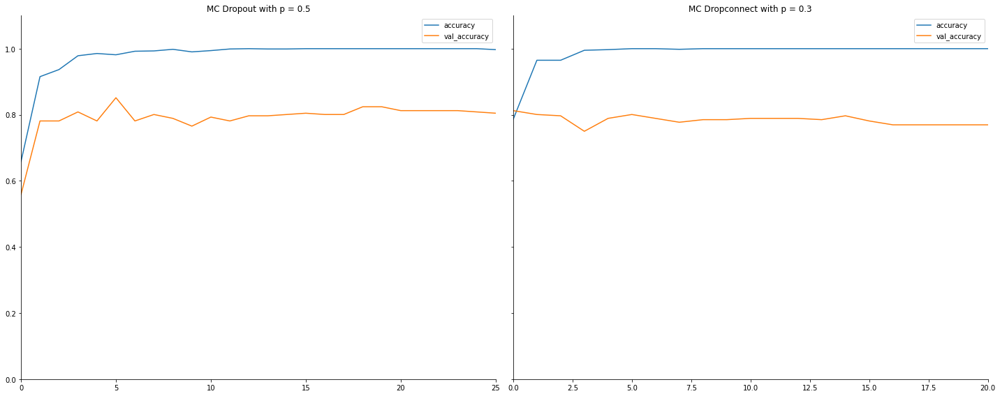

In [19]:
#Plot our training losses

with open(os.path.join(CHECKPOINT_PATH, f"{modelnames[0]}_history.pkl"), "rb") as infile:
    dropout_hist = pickle.load(infile)

with open(os.path.join(CHECKPOINT_PATH, f"{modelnames[2]}_history.pkl"), "rb") as infile:
    dropconnect_hist = pickle.load(infile)

#Plot our losses
fig, ax = plt.subplots(1,2, figsize=(20, 8), tight_layout=True, sharey=True)
plot_history(dropout_hist, ["accuracy", "val_accuracy"], "MC Dropout with p = 0.5", ax=ax[0])
plot_history(dropconnect_hist, ["accuracy", "val_accuracy"], "MC Dropconnect with p = 0.3", ax=ax[1])

Now let's take a look atour datasets. We load a batch of each dataset and instantiate our CNNPlotter class (see HH_CNN.py) and plot some of the images. Notice that the cats and dogs and flowers datasets do not have images that match the sizing correctly of the horse and human dataset. This makes our out of sample data even more disimilar from our the data that our neural network is trained on! We also note that flowers are intuitively more dissimilar to horses and humans. 

In [21]:
#Load our plotter class and sample batches of our data
horse_human_batch = next(val_iter)
cats_dogs_batch = next(catsdogs)
flowers_batch = next(flowers)
cnn_plotter = CNNPlotter()

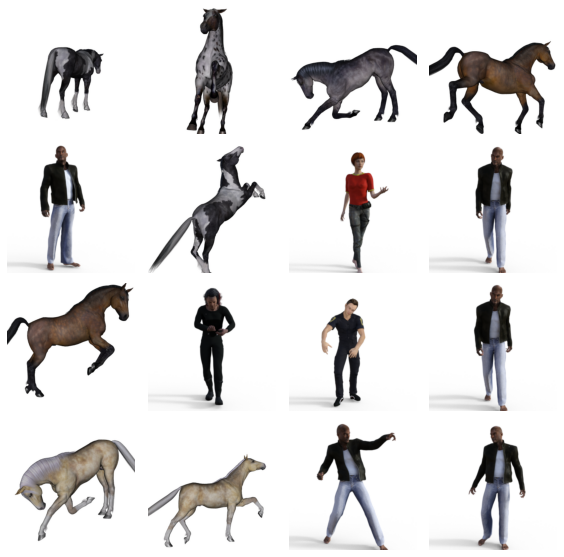

In [23]:
cnn_plotter.plot_batch(horse_human_batch[0], 4, 4, figsize=(8,8))

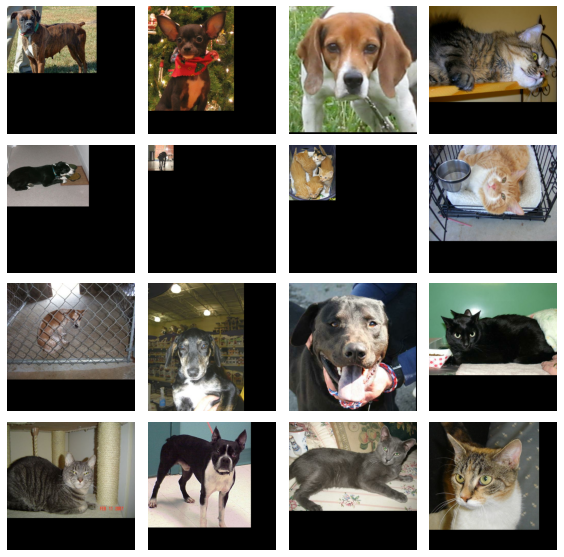

In [25]:
cnn_plotter.plot_batch(cats_dogs_batch[0], 4, 4, figsize=(8, 8))

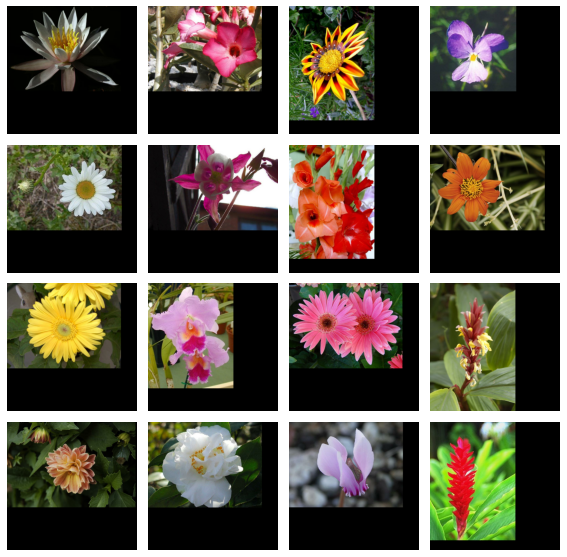

In [24]:
cnn_plotter.plot_batch(flowers_batch[0], 4, 4, figsize=(8, 8))

In [ ]:
#Load plotters and plote some predictions

#Skip this cell if you do not want to repredict. Figures have been saved and can be loaded in the next cell. 

T=500
softmax_plotter = CNNPlotter(model=mc_dropout, labels=LABELS)
dropout_plotter = CNNPlotter(model=mc_dropout, labels=LABELS)
dropconnect_plotter = CNNPlotter(model=mc_dropconnect, labels=LABELS)

def plot_model_predictions(batch_iterator, T):
    images, _ = next(batch_iterator)
    softmax_plotter.plot_batch(images, 4, 4, figsize=(16,16), title="Softmax", predict=True)
    dropout_plotter.plot_batch(images, 4, 4, figsize=(16,16), title="MC Dropout", predict=True, mc=True, T=T)
    dropconnect_plotter.plot_batch(images, 4, 4, figsize=(16,16), title="MC DropConnect", predict=True, mc=True, T=T)
    figs = [softmax_plotter.fig, dropout_plotter.fig, dropconnect_plotter.fig]
    return figs

horse_human_predictions = plot_model_predictions(val_iter, T)
cats_dogs_predictions = plot_model_predictions(catsdogs, T)
flowers_predictions = plot_model_predictions(flowers, T)

datasets = ["horse", "cats", "flowers"]

def save_figs(figs, dataset_name):
    modelnames = ["softmax", "mcdropout", "dropconnect"]
    for fig, modelname in zip(figs, modelnames):
        fig.savefig(os.path.join("figs", f"{modelname}_{dataset_name}_prediction.png"), facecolor="white", transparent=False)
        print(f"{modelname}_{dataset_name}_prediction.png Saved!")

for data_name, predictions in zip(datasets, [horse_human_predictions, cats_dogs_predictions, flowers_predictions]):
    save_figs(predictions, data_name)

Here we will plot some predictions of the models and see how they fare. For each dataset we have randomly predicted a single batch of the data using each of our three methods: the naive model, the MC Dropout model and the MC Dropconnect model. T regulates the number of forward passes that the dropout model will make. The recommendation is to make somewhere between 300-500 forward passes. This is a bit computationally high, so we have run it with T = 500 and saved the figs, so you can see the results below. For each image we report the softmax score that was used and the uncertainty quantification. For the naive model the uncertainty quantification will always read 0 since the model is not uncertainty aware in anyways and is completely confident in its prediction. For the MC Dropout and MC Dropconnect model, the softmax scores represent the mean of T number of stochastic passes. The uncertainty measure for MC Dropout and MC DropConnect uses the mutual information criterion that is typically used to estimate the uncertainty given by our predictions. Mutual information between two random variables X and Y is given by:

$H[P(y|x)] = - \sum_{y \in Y} P(y|x) log P(y|x)$ 
$I(X,Y) = H[P(Y)] - E_{P(X)}H[P(Y|X)]$

Where in our case y is one of the two classes and Y is the set of classes. We simply make T stochastic passes and take the average to get P(y|x). The mutual information criterion can be interpreted as the amount of information we would gain about the model parameters if we were to receive a label y for a new point x. The lowest value of mutual information is 0 and it is theoretically unbounded upwards, although it increases logarithmnically and hence fairly slowly. A value of 0 would claim that there would be no extra information gained by learning the true label over what the model can predict and hence imply no uncertainty. On the other hand higher values of mutual information would then imply more uncertainty claiming that knowledge of the true label would give us more information about the model parameters. Smith breaks down measures of uncertainty in this context in his paper [Understanding Measures of Uncertainty for Adversarial Example Detection](http://auai.org/uai2018/proceedings/papers/207.pdf).

Although this is just one single batch, we can already see that the naive model typically has a softmax score of 1 for its out of sample predictions which is why it is a mistake to use softmax as a proxy for model uncertainty, noting that model uncertainty is distinct from epistemic uncertainty which is an irreducible uncertainty that stems from the data. The canonical example of aleatoric vs epistemic uncertaint is the so-called coin flip example where if given a fair coin, the epistemic uncertainty of the resultant coin flip would be 0.5, yet the aleatoric uncertainty would be 0. In our analogy, being given out of sample data would be akin to being given an unfair coin. The naive model continiues to report the softmax (the epistemic uncertainty) with no awareness or way of becoming aware that the coin might be unfair. On the other hand the MC Dropout and MC DropConnect models have some ability of quantifying this uncertainty of whether or not they actually hold a fair coin, and this is measured by the mutual information criterion given a number of stochastic passes. This is the more accurate way of considering these uncertainty scores. 

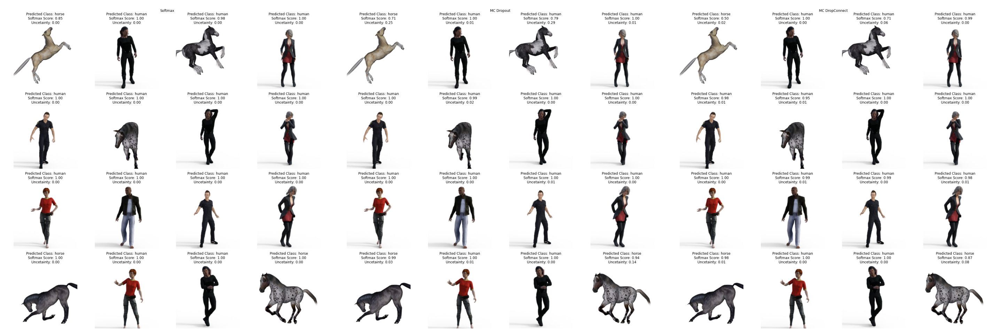

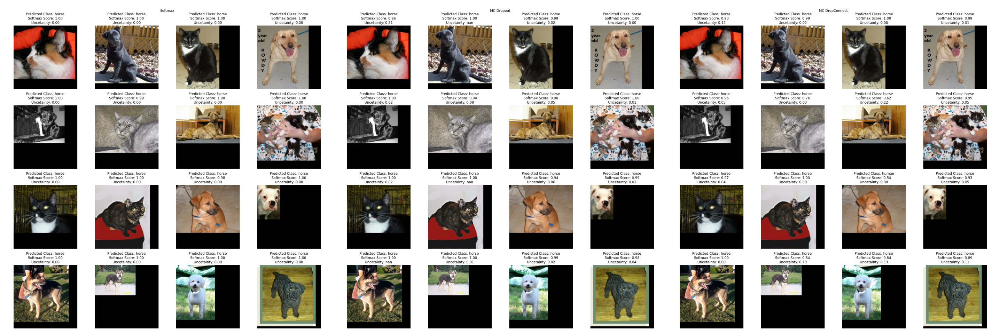

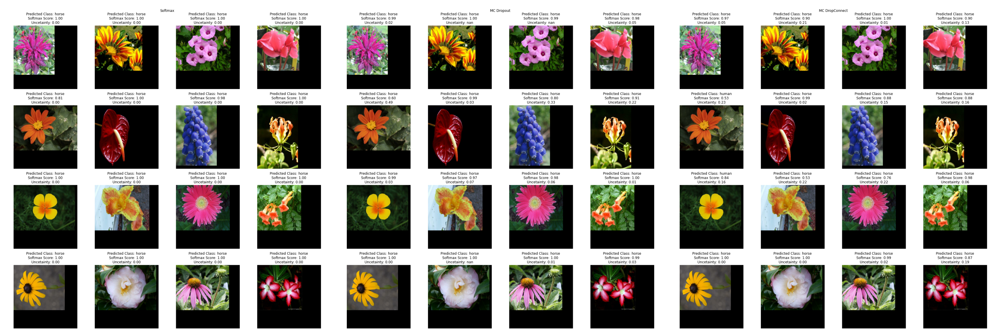

In [29]:
#Load presaved prediction figures

datasets = ["horse", "cats", "flowers"]
modelnames = ["softmax", "mcdropout", "dropconnect"]

prediction_figs = []
for dataset in datasets:
    fig, ax = plt.subplots(1, 3, figsize=(40, 80), tight_layout=True)
    for ax, model in zip(ax.ravel(), modelnames):
        img = mpimg.imread(os.path.join("figs", f"{model}_{dataset}_prediction.png"))
        ax.imshow(img)
        ax.set_axis_off()
    prediction_figs.append(fig)

#The figs folder has larger versions of these figures if not easily viewed


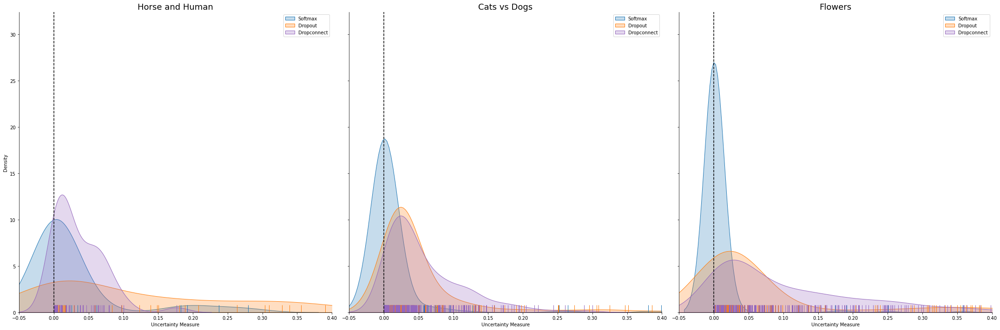

In [11]:
#Load Prediction Measures

models = ["softmax", "dropout", "dropconnect"]
datasets = ["horse", "cat", "flower"]
types = ["correct", "wrong"]
colors = ["tab:blue", "tab:orange", "tab:purple", "tab:olive"]
data_titles = {"horse": "Horse and Human", "cat": "Cats vs Dogs", "flower": "Flowers"}

measures = load_measures(MEASURES_PATH, models, datasets)

Text(0.35, 3.35, 'Horse and Human Classification')

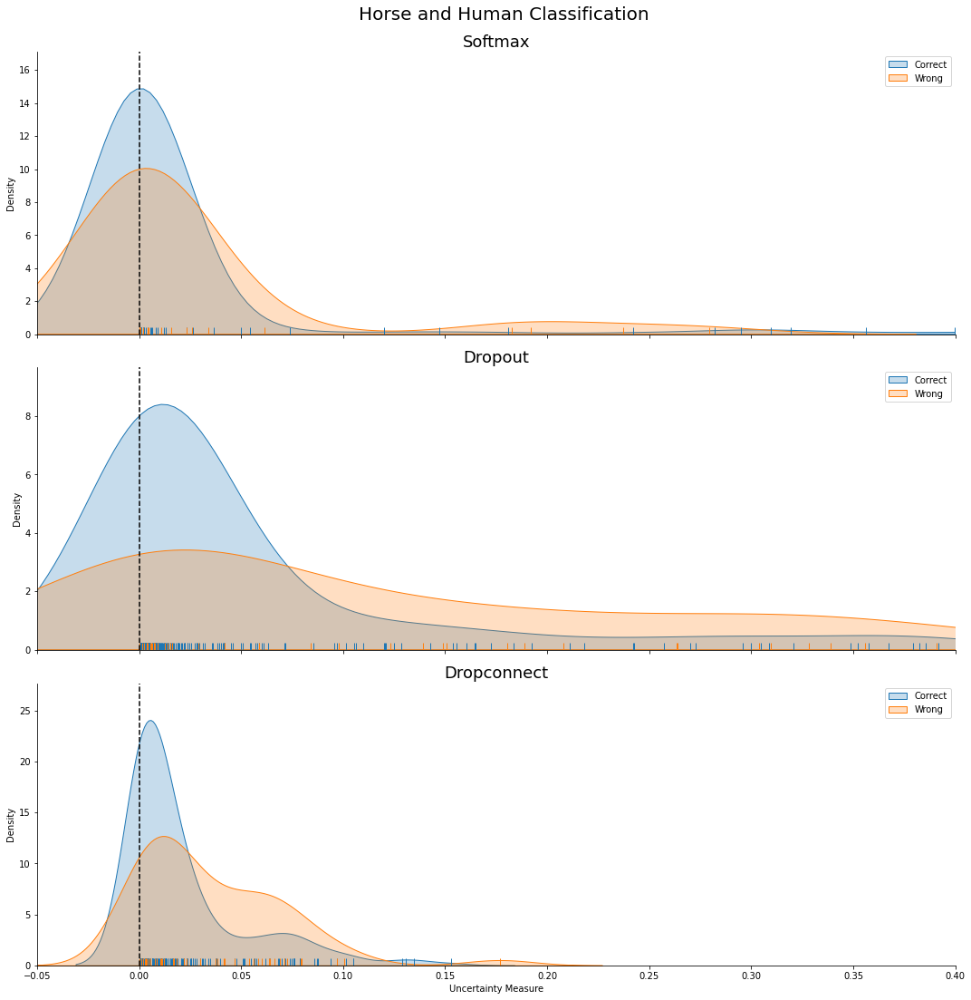

In [13]:

comp_fig, axs = plt.subplots(3, 1, figsize=(15, 15), tight_layout=True, sharey=False, sharex=True)
for ax, model in zip(axs.ravel(), models):
    plot_measures(
        measures, 
        scores=[f"{model}_horse_{t}" for t in types], 
        colors=colors, 
        labels=[t.capitalize() for t in types], 
        ax=ax, 
        title=model.capitalize()
    )
comp_fig.text(x=0.35, y = 3.35, s="Horse and Human Classification", fontsize=20, transform=ax.transAxes)

Finally, we ran the model to predict 16 batches of 16 images for our three datasets: the validation set, the cats and dogs set and the flowers set. We ran 300 stochastic forward passes for each dropout model and then made naive predictions with the softmax by using no stochasticicty in a single forward pass. We plot the distirbution of their corresponding uncertainty measure. We plotted 1 - softmax probability as a pseudo uncertainty measure and the comparison of this with the mutual information gain measure is to be taken with a large grain of salt as this is just to give an idea of what someone might perceive as uncertainty by heuristically using the softmax. The Dropout and Dropconnect distributions are directly comparable. 

The dotted black line indicates 0 and the x-axis starts a bit before 0 for purely aesthetic reasons as it is not possible to take values below 0. The ‘rug’ at the bottom is a compressed visualization of the underlying histogram from which these kernel densities are estimated from. We can see in the horse and human dataset that the softmax is largely predicting with high certainty even though we know the true validation accuracy is not as high as that would suggest. By contrast, both Dropconnect and Dropout are a bit shifted towards the right. The interesting here is Dropout has a much larger spread of uncertainty values. 

Here we compare how the different uncertainty measures for correct and incorrect predictions of the. We can see that MCDropout and MCDropConnect are somehow a bit more uncertain of their predictions and in particular a bit more uncertain when they are wrong based on the dispersion of their distributions as compared to the dispersion of the naive softmax distributions. Unfortunately the centering of their distributions leaves room for improvement and we do not see as much separation as we would want for an uncertainty aware model. MCDropConnect here is slightly better than MCDropout. 

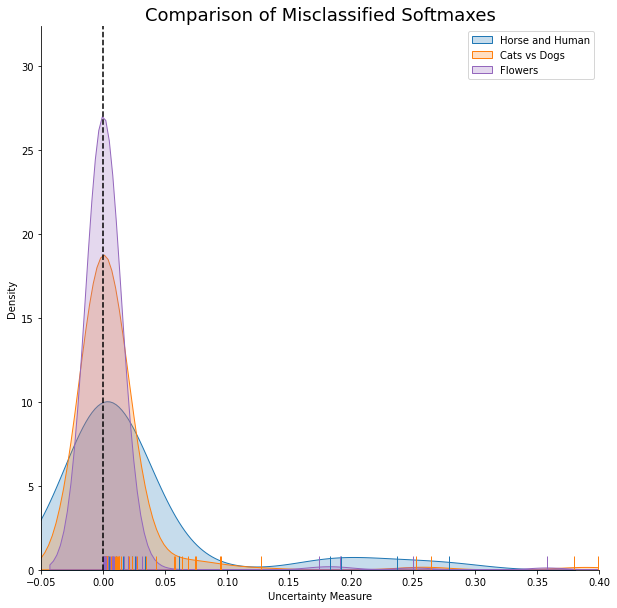

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
plot_measures(
    measures,
    scores = [f"softmax_{data}_wrong" for data in datasets],
    colors=colors,
    labels = [data_titles[data] for data in datasets],
    title="Comparison of Misclassified Softmaxes",
    ax=ax
)

Here we can compare the softmax scores given by a standard model, to show how wrong it would be to use softmax scores as a proxy for model uncertainty. Here the model is increasingly "certain" in the face of out of sample predictions. This is in contrast to above where we can see that MC Dropout and MC Drop Connect are increasingly uncertain as we feed the model samples that are more and more out of sample so to speak. 

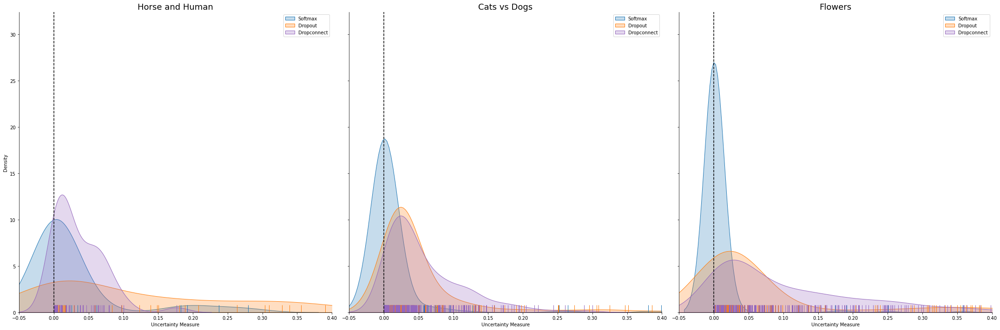

In [12]:
#Plot Prediction Measures
fig, axs = plt.subplots(1, 3, figsize=(30, 10), tight_layout=True, sharey=True)
dataset_figs = []
for ax, data in zip(axs, datasets):
    scores = [f"{m}_{data}_wrong" for m in models]
    labels = [m.capitalize() for m in models]
    plot_measures(measures, scores, colors, labels, title=data_titles[data], ax=ax)

Rather than erroneously comparing the naive softmax measure with the mutual information criterion, it is more important to compare the changes of these distributions across the datasets. The datasets are arranged from the validation set of the in sample data, an out of sample set of cats and dogs, and an out of sample set of flowers which are somehow even less similar to horses and humans than cats and dogs. Counterintuitively, we can see that the softmax scores of the naive model are purportedly more certain as we become more and more out of sample. This is why a softmax score cannot be interpreted as a form of model uncertainty. It has the complete opposite effect of what we wish for. For both MC Dropout and MC DropConnect we can see that the center of their distributions move further and further away from zero as we get more and more out of sample which is a desirable property. Once again we note that the mutual information criterion grows very slowly at first due to its log scale. Nonethless we would have hoped for higher levels of uncertainty for out of sample data. The distributions for MCDropout and MCDropconnect also become more and more dispersed which is desirable except for the distribution for the misclassified validation set for MC Dropout. For that reason, in this example we would prefer the uncertainty measures of MCDropConnect to MCDropout. 